In [43]:
#Import required libraries
#Data management - Sample and Modify
%matplotlib inline
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split

#VIsualization - Explore
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn import tree
from sklearn.datasets import load_breast_cancer
from sklearn.metrics import confusion_matrix

#Modeling - Model
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

#Evaluation -Assess
from sklearn.metrics import classification_report
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

In [25]:
path = "C:/Users/DELL/Pictures/Saved Pictures/databreastcancer.csv"
df = pd.read_csv(path)

In [27]:
#Eye ball the data
df.head()


,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [29]:
df.tail()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,...,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039,NaN


In [31]:
df.sample(5)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
80,861103,B,11.45,20.97,73.81,401.5,0.11020,0.09362,0.045910,0.022330,...,32.16,84.53,525.1,0.1557,0.16760,0.175500,0.06127,0.2762,0.08851,NaN
168,8712766,M,17.47,24.68,116.10,984.6,0.10490,0.16030,0.215900,0.104300,...,32.33,155.30,1660.0,0.1376,0.38300,0.489000,0.17210,0.2160,0.09300,NaN
452,9111843,B,12.00,28.23,76.77,442.5,0.08437,0.06450,0.040550,0.019450,...,37.88,85.07,523.7,0.1208,0.18560,0.181100,0.07116,0.2447,0.08194,NaN
276,8911230,B,11.33,14.16,71.79,396.6,0.09379,0.03872,0.001487,0.003333,...,18.99,77.37,458.0,0.1259,0.07348,0.004955,0.01111,0.2758,0.06386,NaN
563,926125,M,20.92,25.09,143.00,1347.0,0.10990,0.22360,0.317400,0.147400,...,29.41,179.10,1819.0,0.1407,0.41860,0.659900,0.25420,0.2929,0.09873,NaN


In [33]:
df.sample(5)

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [35]:
#Statistical exploration
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [37]:
#VIsualize the data
sns.pairplot(df)

In [58]:
# Import libraries
%matplotlib inline
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer
# Load the dataset
data = load_breast_cancer()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['target'] = data.target  # Add target label (0 = malignant, 1 = benign)

In [60]:
print(df.head())

   mean radius  mean texture  mean perimeter  mean area  mean smoothness  \
0        17.99         10.38          122.80     1001.0          0.11840   
1        20.57         17.77          132.90     1326.0          0.08474   
2        19.69         21.25          130.00     1203.0          0.10960   
3        11.42         20.38           77.58      386.1          0.14250   
4        20.29         14.34          135.10     1297.0          0.10030   

   mean compactness  mean concavity  mean concave points  mean symmetry  \
0           0.27760          0.3001              0.14710         0.2419   
1           0.07864          0.0869              0.07017         0.1812   
2           0.15990          0.1974              0.12790         0.2069   
3           0.28390          0.2414              0.10520         0.2597   
4           0.13280          0.1980              0.10430         0.1809   

   mean fractal dimension  ...  worst texture  worst perimeter  worst area  \
0             

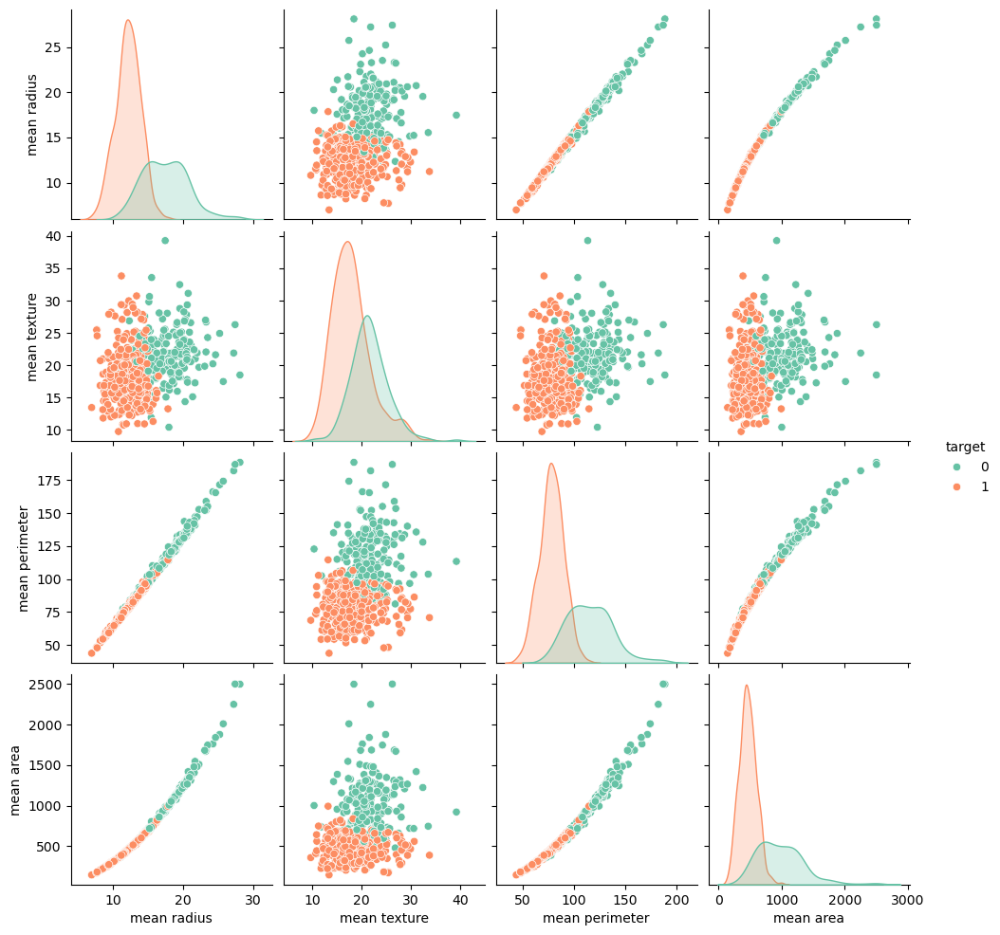

In [62]:
# Visualize selected features
selected_cols = ['mean radius', 'mean texture', 'mean perimeter', 'mean area', 'target']
sns.pairplot(df[selected_cols], hue='target', palette='Set2')
plt.show()

In [3]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

models = {
    'Logistic Regression': LogisticRegression(max_iter=10000),
    'SVM': SVC(),
    'KNN': KNeighborsClassifier(),
    'MLP': MLPClassifier(max_iter=1000)
}


In [12]:

from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

pipeline = ImbPipeline(steps=[
    ('smote', SMOTE(random_state=42)),
    ('scaler', StandardScaler()),
    ('clf', model)
])



In [21]:
params = {
    'Logistic Regression': {
        'clf__C': [0.1, 1, 10]
    },
    'SVM': {
        'clf__C': [0.1, 1, 10],
        'clf__kernel': ['linear', 'rbf']
    },
    'KNN': {
        'clf__n_neighbors': [3, 5, 7]
    },
    'MLP': {
        'clf__hidden_layer_sizes': [(50,), (100,)],
        'clf__alpha': [0.0001, 0.001]
    }
}


In [35]:
cv_results = {}

for name, model in models.items():
    print(f"\nTraining {name}...")

    # Define pipeline: SMOTE -> StandardScaler -> Classifier
    pipeline = ImbPipeline(steps=[
        ('smote', SMOTE(random_state=42)),
        ('scaler', StandardScaler()),
        ('clf', model)
    ])

    # Grid search with Stratified K-Fold
    grid = GridSearchCV(
        pipeline,
        param_grid=params[name],
        scoring='accuracy',
        cv=StratifiedKFold(n_splits=5),
        n_jobs=-1
    )

    grid.fit(X, y)
    print(f"Best parameters: {grid.best_params_}")
    print(f"Cross-validation accuracy: {grid.best_score_:.4f}")
    cv_results[name] = grid




Training Logistic Regression...
Best parameters: {'clf__C': 0.1}
Cross-validation accuracy: 0.9772

Training SVM...
Best parameters: {'clf__C': 10, 'clf__kernel': 'rbf'}
Cross-validation accuracy: 0.9789

Training KNN...
Best parameters: {'clf__n_neighbors': 7}
Cross-validation accuracy: 0.9578

Training MLP...
Best parameters: {'clf__alpha': 0.001, 'clf__hidden_layer_sizes': (50,)}
Cross-validation accuracy: 0.9737


In [37]:
# Use the best model
best_model_name = max(cv_results, key=lambda k: cv_results[k].best_score_)
best_model = cv_results[best_model_name].best_estimator_

# Split for final evaluation
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.3, random_state=42)

# Fit and predict
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)

# Classification report
print(f"\nBest Model: {best_model_name}")
print("Classification Report:")
print(classification_report(y_test, y_pred))


Best Model: SVM
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.95      0.95        64
           1       0.97      0.96      0.97       107

    accuracy                           0.96       171
   macro avg       0.96      0.96      0.96       171
weighted avg       0.96      0.96      0.96       171



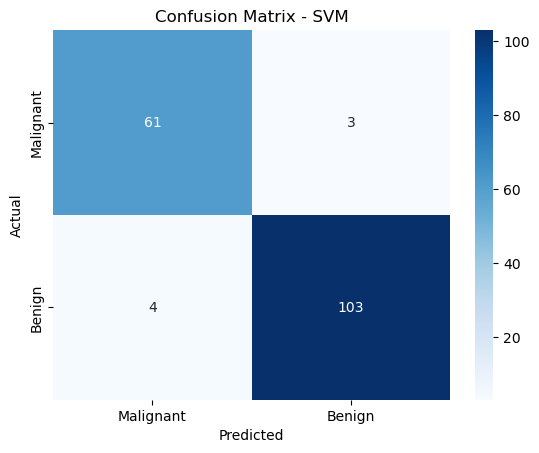

In [45]:
# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Malignant', 'Benign'], yticklabels=['Malignant', 'Benign'])
plt.title(f"Confusion Matrix - {best_model_name}")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

In [51]:
from sklearn.datasets import load_breast_cancer
import pandas as pd

data = load_breast_cancer()
df = pd.DataFrame(data.data, columns=data.feature_names)
df['Outcome'] = data.target

ohe_df = pd.get_dummies(df['Outcome'], prefix='category')
df_encoded = pd.concat([df, ohe_df], axis=1)


In [53]:
df_encoded.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,Outcome,category_0,category_1
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0,True,False
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0,True,False
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0,True,False
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0,True,False
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0,True,False


In [55]:
# Applying Label Encoding
df['outcome_encoded'] = df['Outcome'].astype('category').cat.codes

In [57]:
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,Outcome,outcome_encoded
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0,0


In [67]:
#Select only numeric columns
df2 = df[['mean radius', 'mean texture', 'mean perimeter',
          'mean area', 'mean smoothness', 'mean compactness',
          'mean concavity', 'mean concave points', 'mean symmetry']]
df2.head()


,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809


In [69]:
#MinMax scaling
scaler = MinMaxScaler()
scaler.fit_transform(df2)

array([[0.52103744, 0.0226581 , 0.54598853, ..., 0.70313964, 0.73111332,
        0.68636364],
       [0.64314449, 0.27257355, 0.61578329, ..., 0.20360825, 0.34875746,
        0.37979798],
       [0.60149557, 0.3902604 , 0.59574321, ..., 0.46251172, 0.63568588,
        0.50959596],
       ...,
       [0.45525108, 0.62123774, 0.44578813, ..., 0.21675258, 0.26351889,
        0.26767677],
       [0.64456434, 0.66351031, 0.66553797, ..., 0.82333646, 0.7554672 ,
        0.67525253],
       [0.03686876, 0.50152181, 0.02853984, ..., 0.        , 0.        ,
        0.26616162]])

In [71]:
df2.columns

Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry'],
      dtype='object')

In [83]:
#MinMax scaling
scaler = MinMaxScaler()
df_x_norm = scaler.fit_transform(df_x)


In [85]:
df_x_norm

array([[0.52103744, 0.0226581 , 0.54598853, ..., 0.70313964, 0.73111332,
        0.68636364],
       [0.64314449, 0.27257355, 0.61578329, ..., 0.20360825, 0.34875746,
        0.37979798],
       [0.60149557, 0.3902604 , 0.59574321, ..., 0.46251172, 0.63568588,
        0.50959596],
       ...,
       [0.45525108, 0.62123774, 0.44578813, ..., 0.21675258, 0.26351889,
        0.26767677],
       [0.64456434, 0.66351031, 0.66553797, ..., 0.82333646, 0.7554672 ,
        0.67525253],
       [0.03686876, 0.50152181, 0.02853984, ..., 0.        , 0.        ,
        0.26616162]])

In [91]:
#Build model
model_dt = DecisionTreeClassifier()
model_dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [93]:
#Visualize the decision tree
text_representation = tree.export_text(model_dt)
print(text_representation)

|--- feature_20 <= 16.80
|   |--- feature_27 <= 0.14
|   |   |--- feature_14 <= 0.00
|   |   |   |--- feature_11 <= 0.79
|   |   |   |   |--- class: 1
|   |   |   |--- feature_11 >  0.79
|   |   |   |   |--- class: 0
|   |   |--- feature_14 >  0.00
|   |   |   |--- feature_13 <= 35.44
|   |   |   |   |--- feature_21 <= 33.27
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_21 >  33.27
|   |   |   |   |   |--- feature_21 <= 33.80
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_21 >  33.80
|   |   |   |   |   |   |--- class: 1
|   |   |   |--- feature_13 >  35.44
|   |   |   |   |--- feature_24 <= 0.15
|   |   |   |   |   |--- feature_15 <= 0.01
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_15 >  0.01
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_24 >  0.15
|   |   |   |   |   |--- class: 0
|   |--- feature_27 >  0.14
|   |   |--- feature_21 <= 23.74
|   |   |   |--- feature_27 <= 0.19
|   |   |   |   |---

In [101]:
fig = plt.figure(figsize=(25,20))
_ = tree.plot_tree(model_dt, feature_names= df2.columns.drop('outcome_encoded'), class_names=df['Outcome'], filled=True)

Index(['mean radius', 'mean texture', 'mean perimeter', 'mean area',
       'mean smoothness', 'mean compactness', 'mean concavity',
       'mean concave points', 'mean symmetry'],
      dtype='object')


In [105]:
class_names=['Malignant', 'Benign']


In [107]:
print(df['Outcome'].unique())


[0 1]


In [115]:
pred = model_dt.predict(X_train)

In [117]:
pred


array([1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1,
       0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0,
       0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1,
       1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1,
       0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1,
       1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0,
       1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1,
       0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1,

In [119]:
#Assement - Evluation
target_names = [str(i) for i in [0, 1]]
print(classification_report(y_train, pred, target_names=target_names))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       148
           1       1.00      1.00      1.00       250

    accuracy                           1.00       398
   macro avg       1.00      1.00      1.00       398
weighted avg       1.00      1.00      1.00       398



In [121]:
pred_test = model_dt.predict(X_test)

In [123]:
pred_test

array([0, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0,
       0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1])

In [125]:
#Assement - Evluation
target_names = [str(i) for i in [0, 1]]
print(classification_report(y_test, pred_test, target_names=target_names))

              precision    recall  f1-score   support

           0       0.88      0.88      0.88        64
           1       0.93      0.93      0.93       107

    accuracy                           0.91       171
   macro avg       0.90      0.90      0.90       171
weighted avg       0.91      0.91      0.91       171



In [127]:
#Create training 80% and testing 20%
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [129]:
#Build model
model_dt_2 = DecisionTreeClassifier()
model_dt_2.fit(X_train, y_train)

DecisionTreeClassifier()

In [135]:
predict_train = model_dt_2.predict(X_train)


In [137]:
#Assement - Evluation
target_names = [str(i) for i in [0, 1]]
print(classification_report(y_train, predict_train, target_names=target_names))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       169
           1       1.00      1.00      1.00       286

    accuracy                           1.00       455
   macro avg       1.00      1.00      1.00       455
weighted avg       1.00      1.00      1.00       455



In [139]:
#Assement - Evluation
predict_test = model_dt_2.predict(X_test)
target_names = [str(i) for i in [0, 1]]
print(classification_report(y_test, predict_test, target_names=target_names))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93        43
           1       0.96      0.96      0.96        71

    accuracy                           0.95       114
   macro avg       0.94      0.94      0.94       114
weighted avg       0.95      0.95      0.95       114



In [141]:
model_rf = RandomForestClassifier()
model_svm = SVC()
model_knn = KNeighborsClassifier(n_neighbors=3)


In [143]:
model_rf.fit(X_train, y_train)
model_svm.fit(X_train, y_train)
model_knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [146]:
rf_train_pred = model_rf.predict(X_train)
svm_train_pred = model_svm.predict(X_train)
knn_train_pred = model_knn.predict(X_train)

In [148]:
#Classification report
#Assement - Evluation
target_names = [str(i) for i in [0, 1]]

#RF
print('n Random forest trainin..\n')
print(classification_report(y_train, rf_train_pred, target_names=target_names))

#SVM
print('n SVM for training..\n')
print(classification_report(y_train, svm_train_pred, target_names=target_names))

#KNN
print('n KNN trainin..\n')
print(classification_report(y_train, knn_train_pred, target_names=target_names))

n Random forest trainin..

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       169
           1       1.00      1.00      1.00       286

    accuracy                           1.00       455
   macro avg       1.00      1.00      1.00       455
weighted avg       1.00      1.00      1.00       455

n SVM for training..

              precision    recall  f1-score   support

           0       0.96      0.80      0.87       169
           1       0.89      0.98      0.94       286

    accuracy                           0.91       455
   macro avg       0.93      0.89      0.90       455
weighted avg       0.92      0.91      0.91       455

n KNN trainin..

              precision    recall  f1-score   support

           0       0.97      0.89      0.93       169
           1       0.94      0.98      0.96       286

    accuracy                           0.95       455
   macro avg       0.95      0.94      0.94       455
weighted

In [150]:
#Verify on test set
rf_test_pred = model_rf.predict(X_test)
svm_test_pred = model_svm.predict(X_test)
knn_test_pred = model_knn.predict(X_test)

#RF
print('n Random forest trainin..\n')
print(classification_report(y_test, rf_test_pred, target_names=target_names))

#SVM
print('n SVM for training..\n')
print(classification_report(y_test, svm_test_pred, target_names=target_names))

#KNN
print('n KNN trainin..\n')
print(classification_report(y_test, knn_test_pred, target_names=target_names))

n Random forest trainin..

              precision    recall  f1-score   support

           0       0.98      0.93      0.95        43
           1       0.96      0.99      0.97        71

    accuracy                           0.96       114
   macro avg       0.97      0.96      0.96       114
weighted avg       0.97      0.96      0.96       114

n SVM for training..

              precision    recall  f1-score   support

           0       1.00      0.86      0.93        43
           1       0.92      1.00      0.96        71

    accuracy                           0.95       114
   macro avg       0.96      0.93      0.94       114
weighted avg       0.95      0.95      0.95       114

n KNN trainin..

              precision    recall  f1-score   support

           0       0.93      0.88      0.90        43
           1       0.93      0.96      0.94        71

    accuracy                           0.93       114
   macro avg       0.93      0.92      0.92       114
weighted

In [152]:
#Imporovement
from sklearn.naive_bayes import GaussianNB
model_nb = GaussianNB()

In [154]:
model_nb.fit(X_train, y_train)

GaussianNB()

In [156]:
nb_train_pred = model_nb.predict(X_train)
nb_test_pred = model_nb.predict(X_test)

In [158]:
#NB
print('n NB trainin..\n')
print(classification_report(y_train, nb_train_pred, target_names=target_names))

print('n NB testing..\n')
print(classification_report(y_test, nb_test_pred, target_names=target_names))

n NB trainin..

              precision    recall  f1-score   support

           0       0.94      0.88      0.91       169
           1       0.93      0.97      0.95       286

    accuracy                           0.94       455
   macro avg       0.94      0.93      0.93       455
weighted avg       0.94      0.94      0.94       455

n NB testing..

              precision    recall  f1-score   support

           0       1.00      0.93      0.96        43
           1       0.96      1.00      0.98        71

    accuracy                           0.97       114
   macro avg       0.98      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114

